In [2]:
### This began with a great head start from Johnowhitaker:
### https://zindi.africa/competitions/fowl-escapades/discussions/675

In [3]:
### And the first serious attempt to ensure I can reproduce identical results with a FastAI model & notebook
### the jupyter notebook was started with this command:
### env PYTHONHASHSEED=42 jupyter notebook
### per this FastAI thread: 
### https://forums.fast.ai/t/solved-reproducibility-where-is-the-randomness-coming-in/31628/15

In [4]:
### next step in reproducibility is to set up the various seeds within the notebook
### and this will need to be called:
###  You have to run random_seed(0), before the first fit;
###  You have to run it before creating the databunch;
###  And you have to call it every time for each different time you call fit.

def random_seed(seed_value, use_cuda):
    np.random.seed(seed_value) # cpu vars
    torch.manual_seed(seed_value) # cpu  vars
    random.seed(seed_value) # Python
    if use_cuda: 
        torch.cuda.manual_seed(seed_value)
        torch.cuda.manual_seed_all(seed_value) # gpu vars
        torch.backends.cudnn.deterministic = True  #needed
        torch.backends.cudnn.benchmark = False

In [5]:
!ls

blend_f18f.csv			      fastai_v7.csv
blend_f18f_v2.csv		      five-sec-samples.ipynb
blend_f18f_v3.csv		      models
blend.R				      repro-fowl-A17a.ipynb
blend_v6_v7.csv			      repro-fowl-A17a-repro.ipynb
colab-follow-along.ipynb	      repro-fowl-data-creation.ipynb
colab-improve-try1.ipynb	      Rsplits
colab-improve-try2.ipynb	      Rsplits_Test
colab-improve-try3-rn34.ipynb	      Rsplits_Train
colab-improve-try4-rn50.ipynb	      R_splitter.R
colab-improve-try5-rn50v2.ipynb       SampleSubmission.csv
colab-improve-try6-densenet201.ipynb  splits_max_prob_row.csv
day1.R				      StarterNotebook.ipynb
default_plus_WBSR.csv		      Test
default_sub.csv			      Test.csv
fastai_A17a.csv			      TestSplits.csv
fastai_f18c.csv			      Test_Wavs
fastai_f18d.csv			      Test.zip
fastai_f18e.csv			      Train
fastai_f18f.csv			      Train.csv
fastai_follow_along.csv		      Train_Cuts
fastai_splits_v1.csv		      train_rates.csv
fastai_v2.csv			      TrainSplits.csv
fastai_v3.csv			      Train_

In [6]:
import pandas as pd
sub = pd.read_csv('SampleSubmission.csv')
sub.head()

,ID,Ring-necked Dove,Black Cuckoo,Red-chested Cuckoo,Fiery-necked Nightjar,Green Wood Hoopoe,Crested Barbet,Cape Batis,Olive Bushshrike,Orange-breasted Bushshrike,...,Karoo Scrub Robin,White-browed Scrub Robin,Cape Robin-Chat,White-browed Robin-Chat,Chorister Robin-Chat,Southern Double-collared Sunbird,White-bellied Sunbird,African Pipit,African Rock Pipit,Cape Bunting
0,019OYB,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,01S9OX,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,02CS12,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,02LM3W,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0C3A2V,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [7]:
train = pd.read_csv('Train.csv')
train.head()

,ID,common_name
0,MBMG2C,Ring-necked Dove
1,K8LJSB,Ring-necked Dove
2,OGD9L6,Ring-necked Dove
3,581PCQ,Ring-necked Dove
4,P91M1F,Ring-necked Dove


In [8]:
birds = sub.columns[1:]
birds

Index(['Ring-necked Dove', 'Black Cuckoo', 'Red-chested Cuckoo',
       'Fiery-necked Nightjar', 'Green Wood Hoopoe', 'Crested Barbet',
       'Cape Batis', 'Olive Bushshrike', 'Orange-breasted Bushshrike',
       'Bokmakierie', 'Black-backed Puffback', 'Southern Boubou',
       'Black-headed Oriole', 'Fork-tailed Drongo',
       'African Paradise Flycatcher', 'Sabota Lark', 'Eastern Clapper Lark',
       'Rufous-naped Lark', 'Dark-capped Bulbul', 'Sombre Greenbul',
       'Long-billed Crombec', 'African Reed Warbler', 'Rattling Cisticola',
       'Levaillants Cisticola', 'Tawny-flanked Prinia', 'Karoo Prinia',
       'Bar-throated Apalis', 'Green-backed Camaroptera',
       'Chestnut-vented Warbler', 'Cape White-eye', 'Karoo Scrub Robin',
       'White-browed Scrub Robin', 'Cape Robin-Chat',
       'White-browed Robin-Chat', 'Chorister Robin-Chat',
       'Southern Double-collared Sunbird', 'White-bellied Sunbird',
       'African Pipit', 'African Rock Pipit', 'Cape Bunting'],
      d

In [9]:
# Add file names
train['file_name'] = 'Train/'+train['ID']+'.mp3'
sub['file_name'] = 'Test/'+sub['ID']+'.mp3'

In [10]:
import IPython.display as ipd
from matplotlib import pyplot as plt
import librosa

In [11]:
#listen to a sound
pth = train['file_name'].sample(1).values[0]
ipd.Audio(pth) 

/home/mark/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


Train/CMDXN1.png


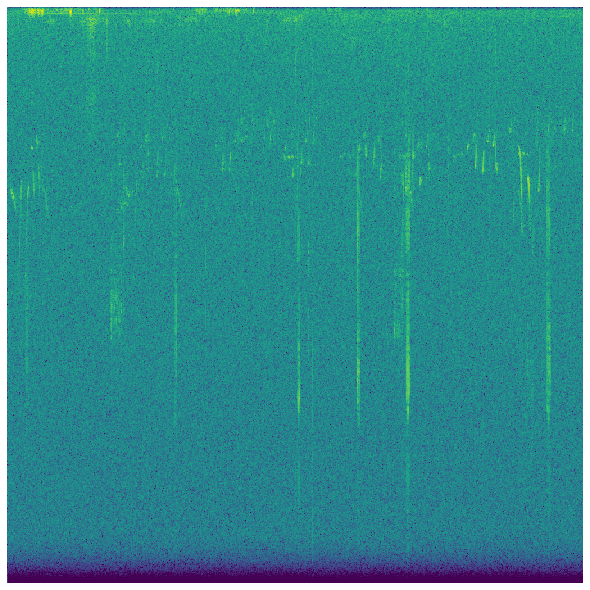

In [23]:
def gen_spectrogram(path):
  x , sr = librosa.load(path)
  X = librosa.stft(x)
  Xdb = librosa.amplitude_to_db(abs(X)[:,:min(1025, len(X[0]))])
  fig = plt.figure(frameon=False)
  fig.set_size_inches(8, 8)
  ax = plt.Axes(fig, [0., 0., 1., 1.])
  ax.set_axis_off()
  fig.add_axes(ax)
  ax.imshow(Xdb, aspect='auto')
  fig.savefig(path[:-4]+'.png', dpi=512//8)
  print(path[:-4]+'.png')

gen_spectrogram(pth)

/home/mark/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')
/home/mark/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


Train/CMDXN1.cut0.png


/home/mark/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


Train/CMDXN1.cut1.png


/home/mark/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


Train/CMDXN1.cut2.png


/home/mark/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


Train/CMDXN1.cut3.png


/home/mark/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


Train/CMDXN1.cut4.png


/home/mark/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


Train/CMDXN1.cut5.png


/home/mark/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


Train/CMDXN1.cut6.png


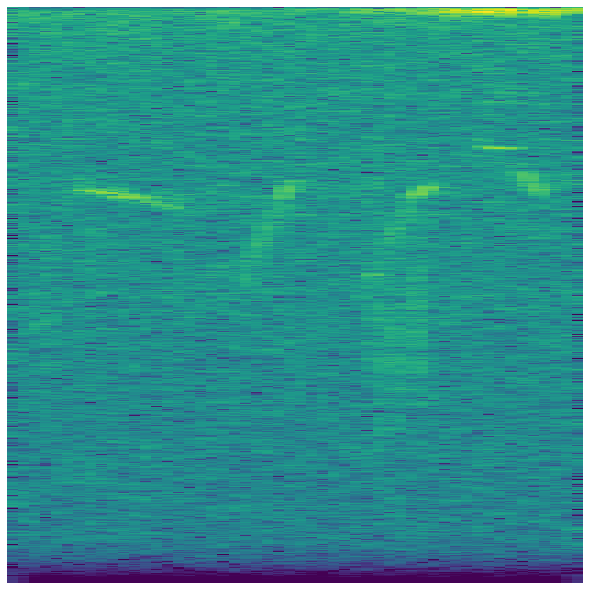

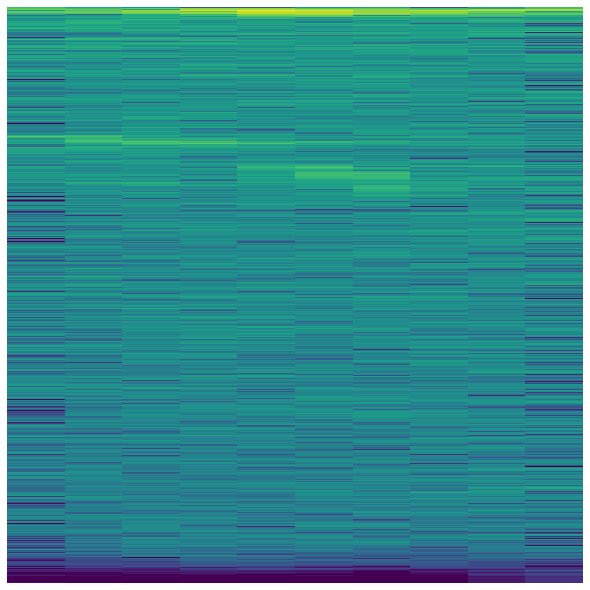

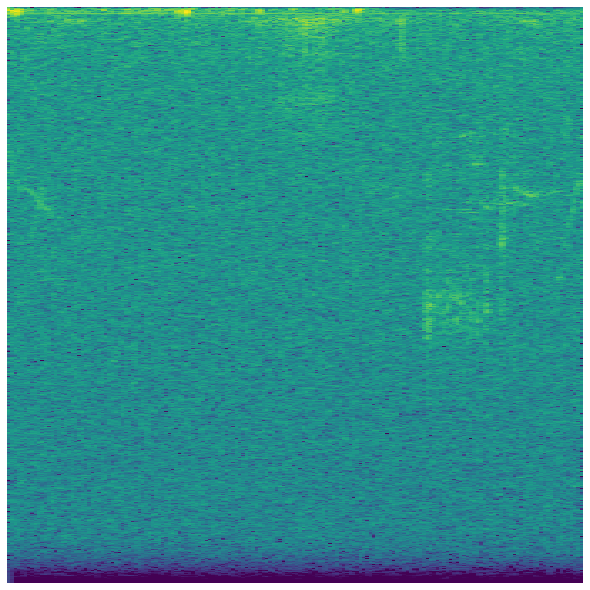

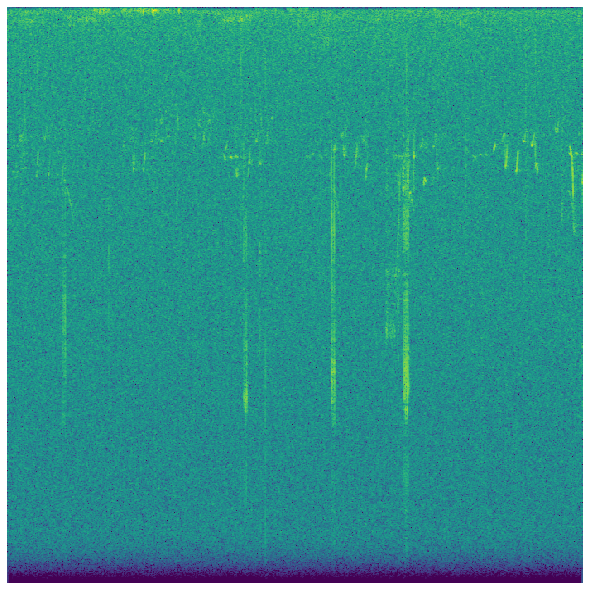

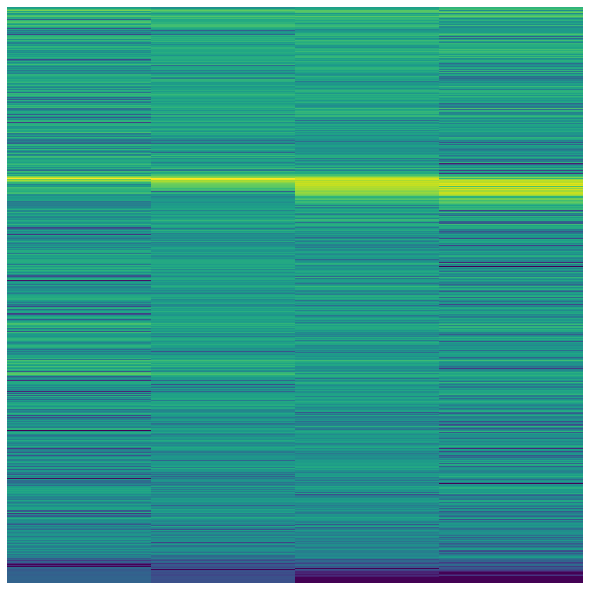

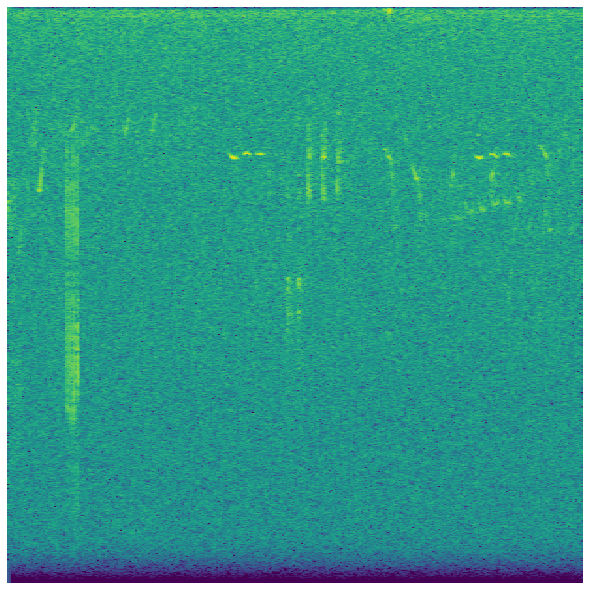

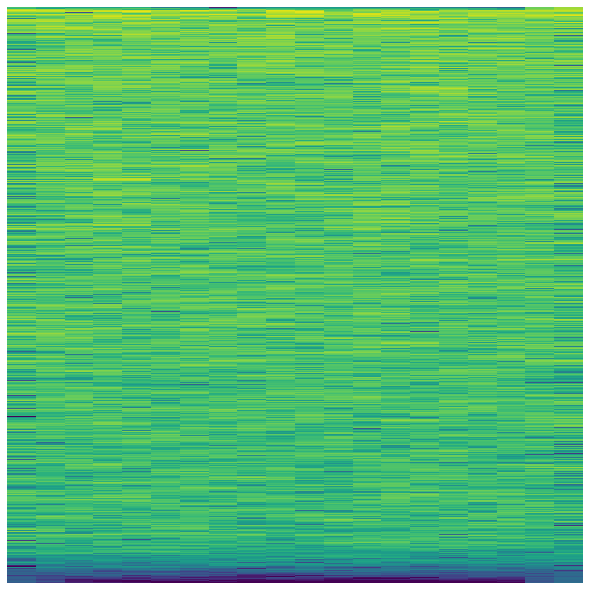

In [25]:
### This function works as intended. However, it is likely much wiser to 
###  create a single spectogram and cut it into logical pieces so that 
###  everything is properly normalized.
### Possibly use the bound_times to divide the pictures and resize
### Or just divide into evenly spaced sections to generate more info
### In either case, will likely generate some pure noise chunks and may need to handle those
def gen_spectrogram_cuts(path):
  x , sr = librosa.load(path)
  chroma = librosa.feature.chroma_cqt(y=x, sr=sr)
  chunk_size = round(x.shape[0] / sr / 5)
  bounds = librosa.segment.agglomerative(chroma, chunk_size)
  bound_times = librosa.frames_to_time(bounds, sr=sr)
  for i in range(0, len(bound_times)-1):
    x2, sr2 = librosa.load(path,offset=bound_times[i],duration=bound_times[i+1]-bound_times[i])
    X = librosa.stft(x2)
    Xdb = librosa.amplitude_to_db(abs(X)[:,:min(1025, len(X[0]))])
    fig = plt.figure(frameon=False)
    fig.set_size_inches(8, 8)
    ax = plt.Axes(fig, [0., 0., 1., 1.])
    ax.set_axis_off()
    fig.add_axes(ax)
    ax.imshow(Xdb, aspect='auto')
    fig.savefig(path[:-4]+'.cut'+str(i)+'.png', dpi=512//8)
    print(path[:-4]+'.cut'+str(i)+'.png')

gen_spectrogram_cuts(pth)

1 % done


/home/mark/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')
/home/mark/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')
/home/mark/.local/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()
/home/mark/.local/lib/python3.6/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


Train/UGAHZQ.cut0.png


KeyboardInterrupt: 

<Figure size 432x288 with 0 Axes>

<Figure size 576x576 with 0 Axes>

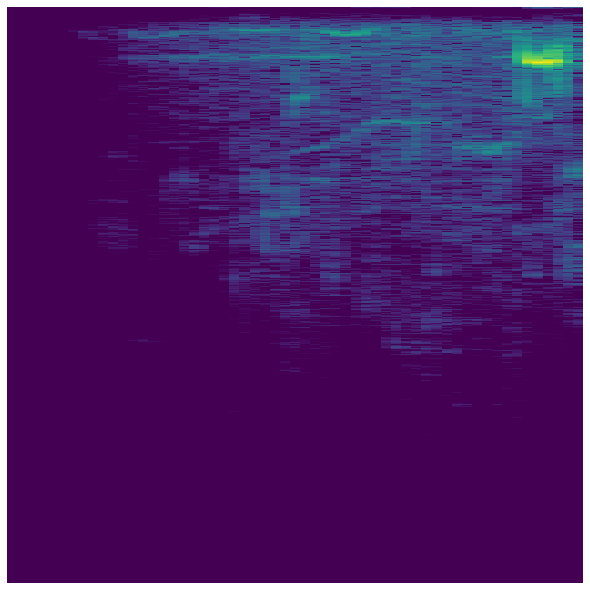

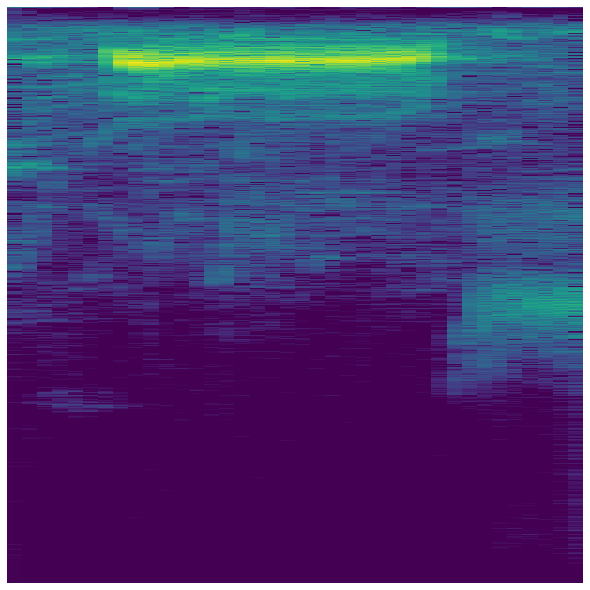

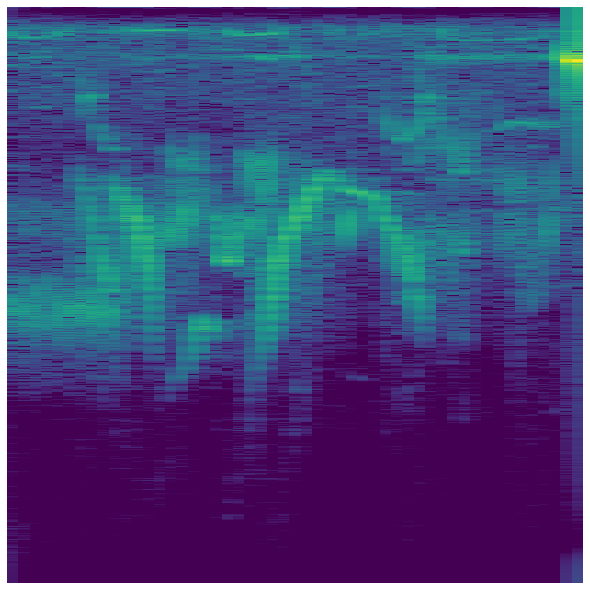

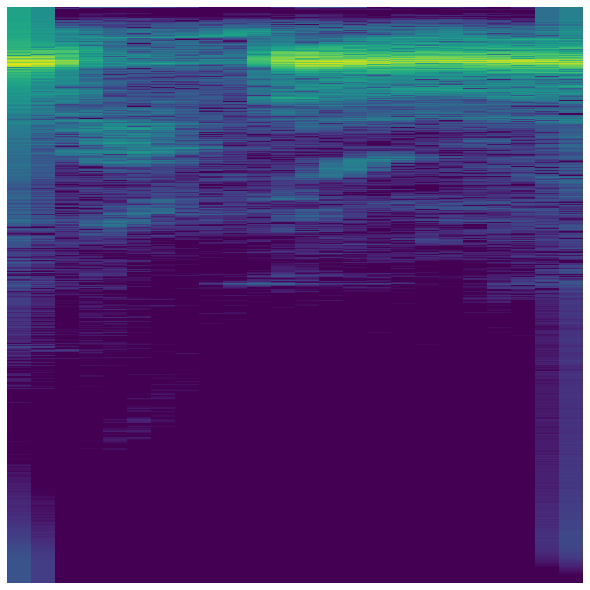

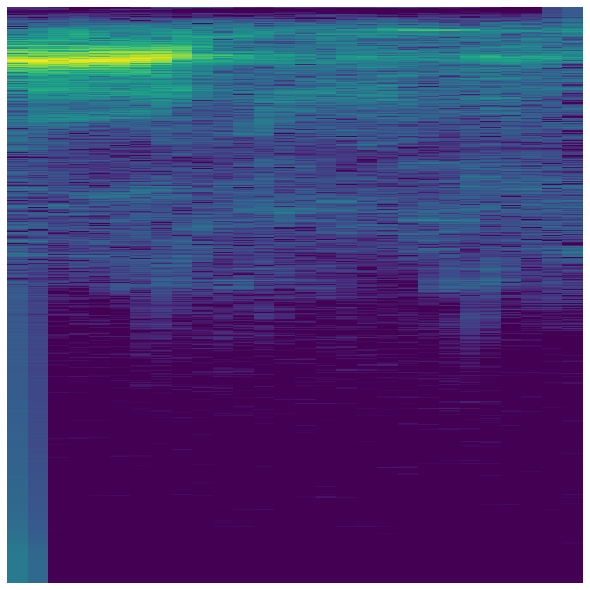

...

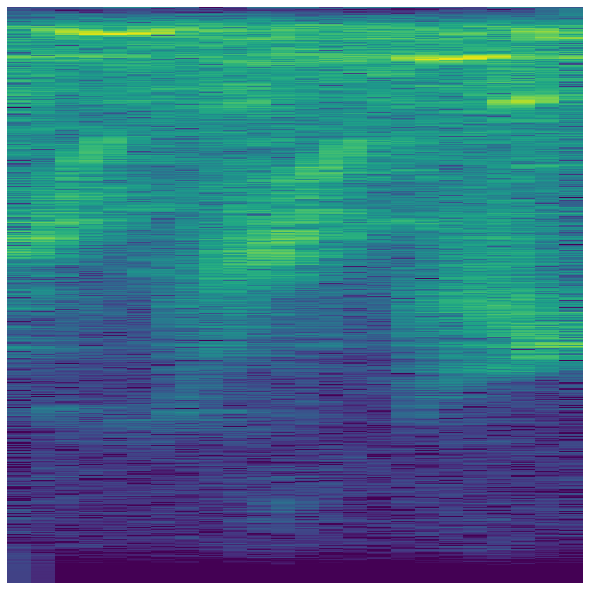

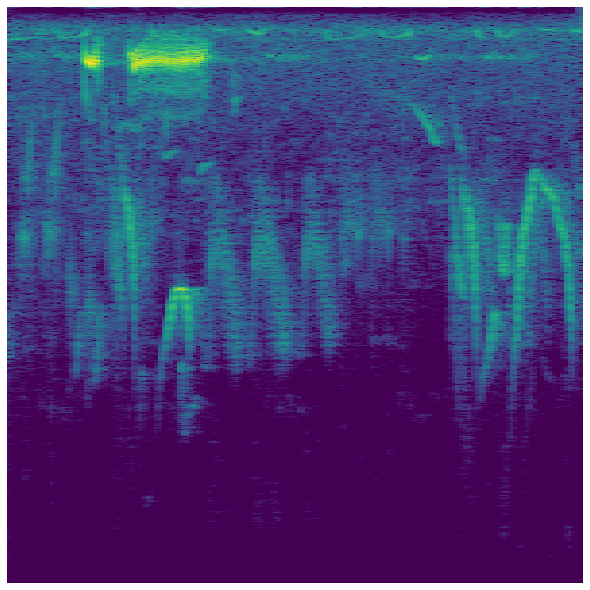

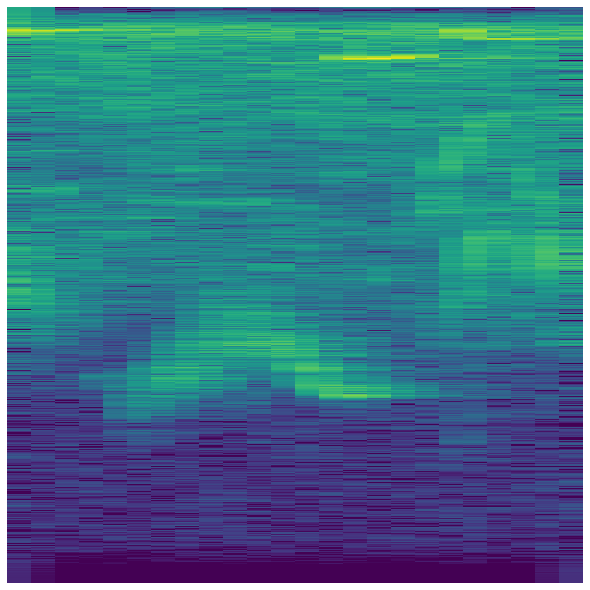

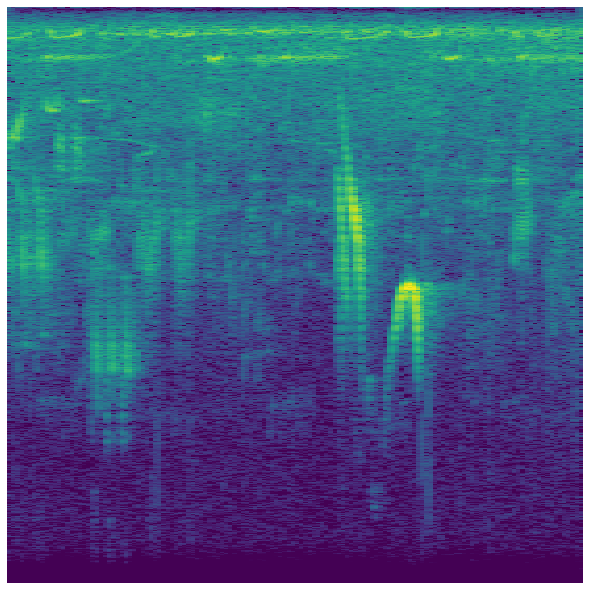

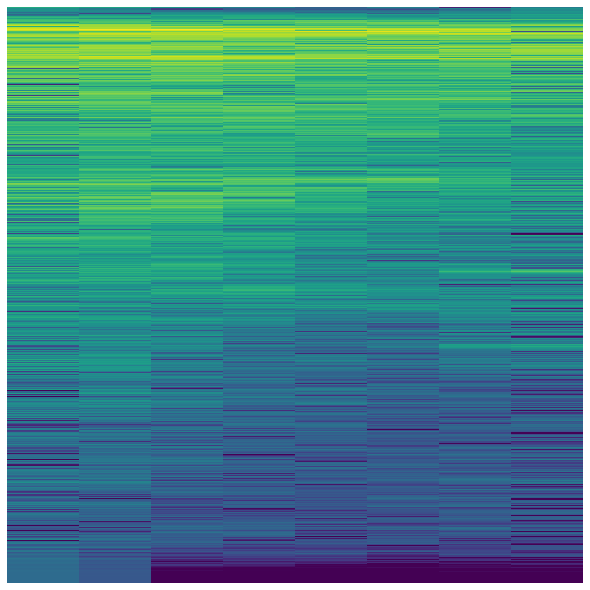

<Figure size 576x576 with 0 Axes>

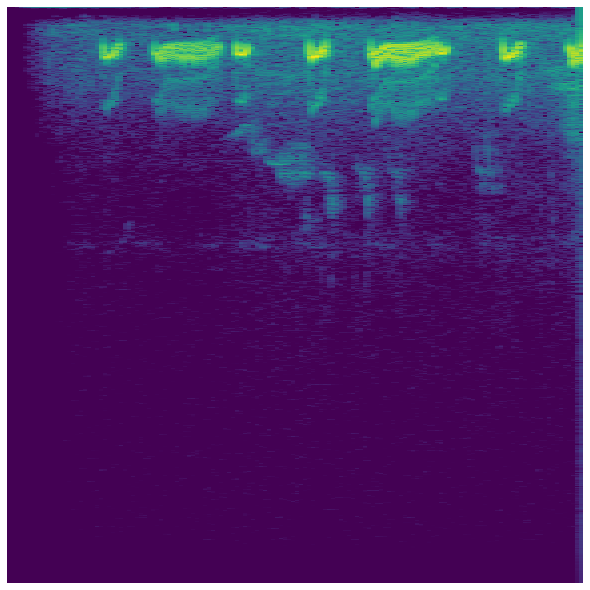

<Figure size 576x576 with 0 Axes>

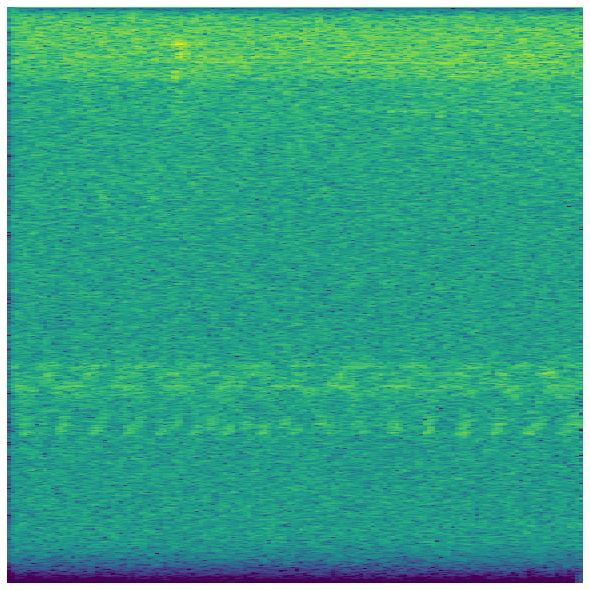

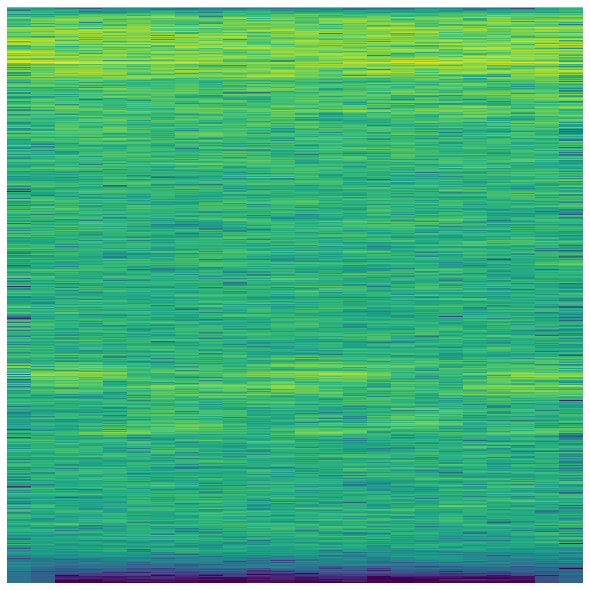

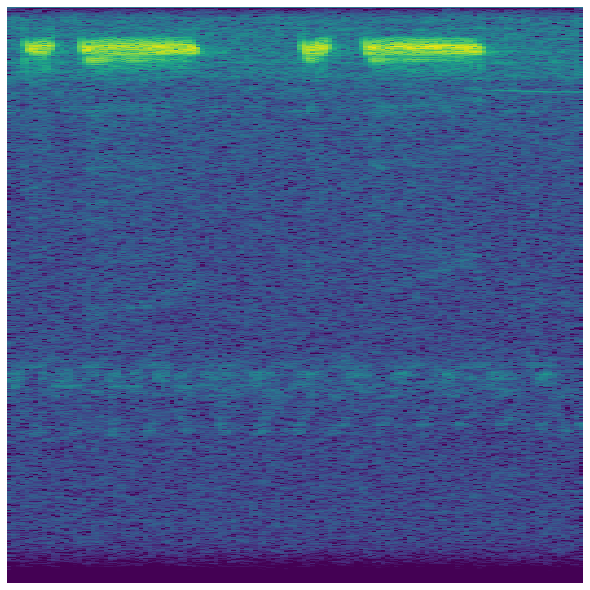

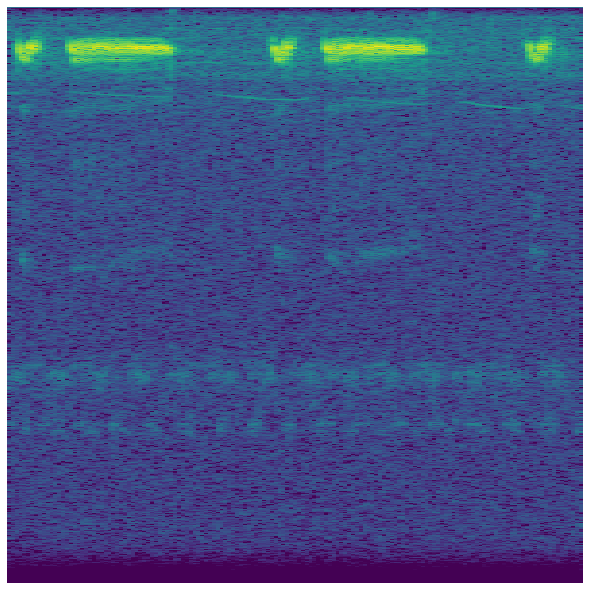

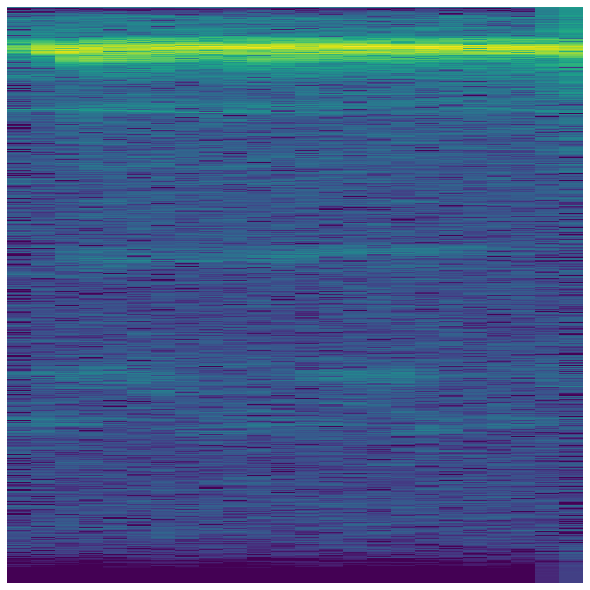

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

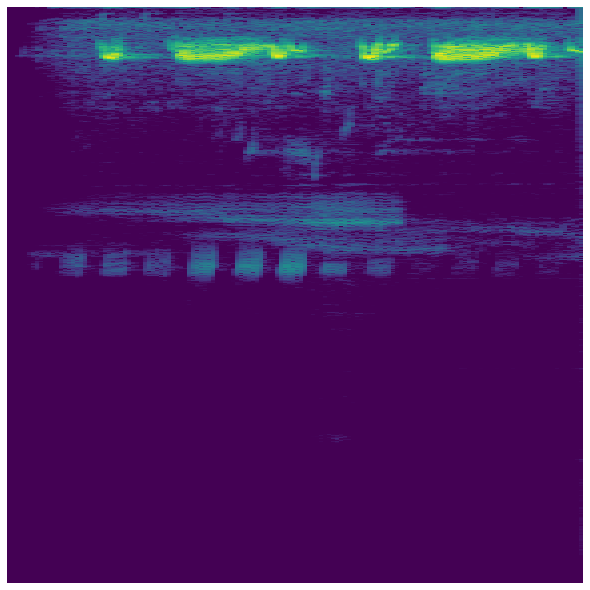

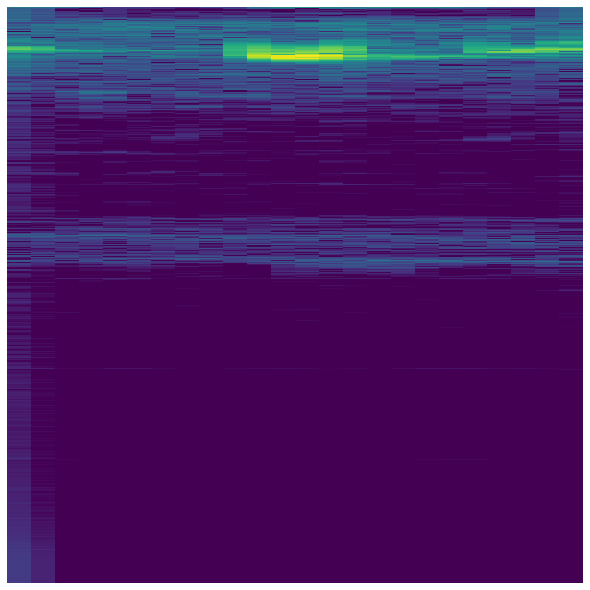

<Figure size 576x576 with 0 Axes>

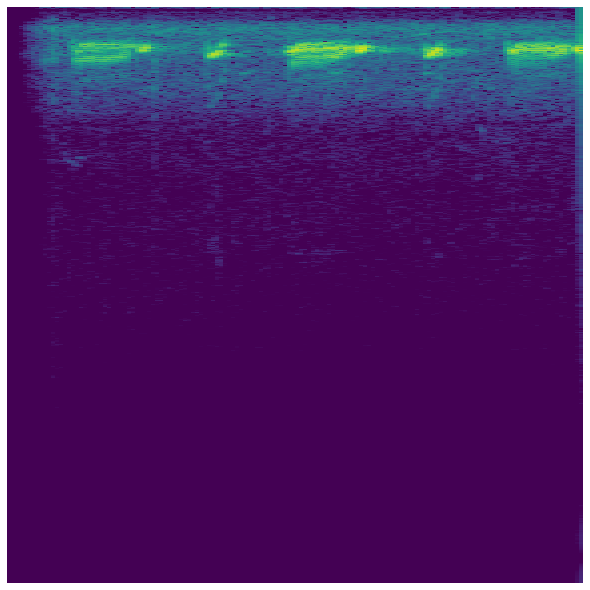

<Figure size 576x576 with 0 Axes>

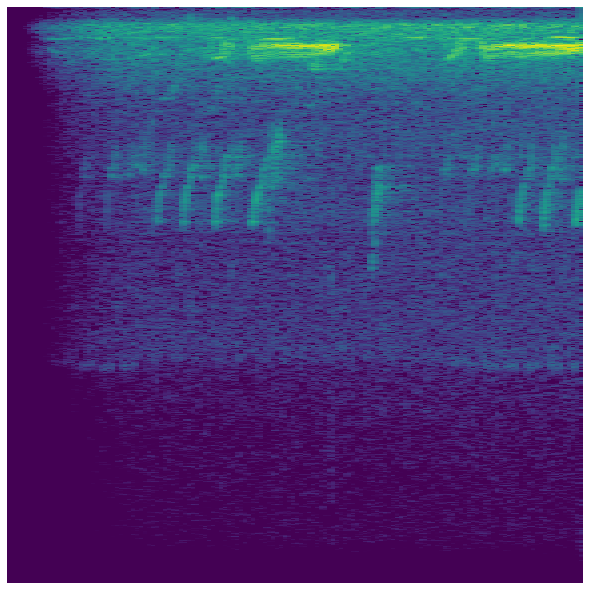

<Figure size 576x576 with 0 Axes>

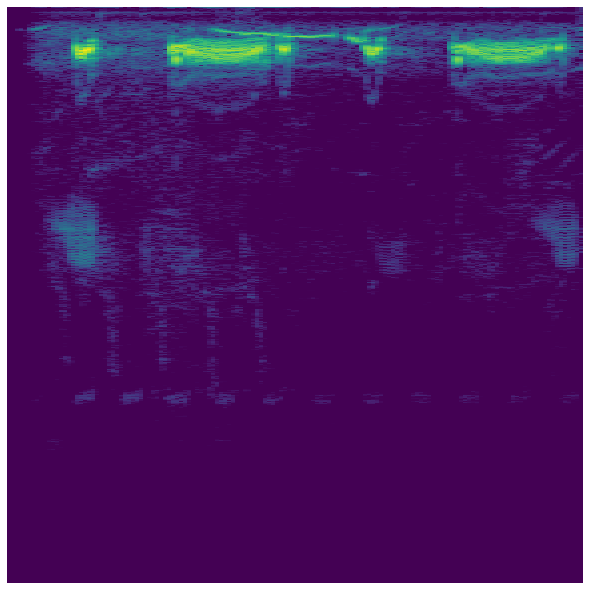

<Figure size 576x576 with 0 Axes>

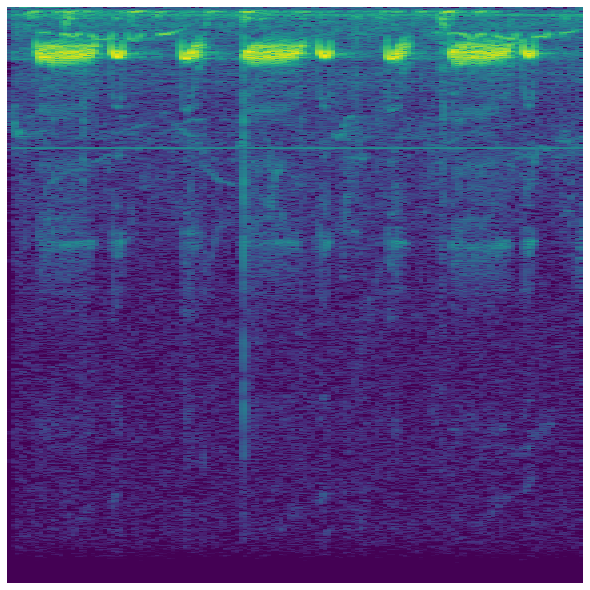

<Figure size 576x576 with 0 Axes>

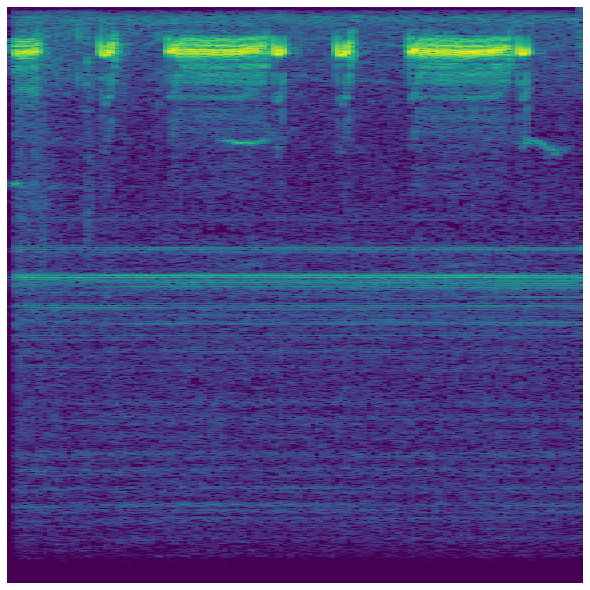

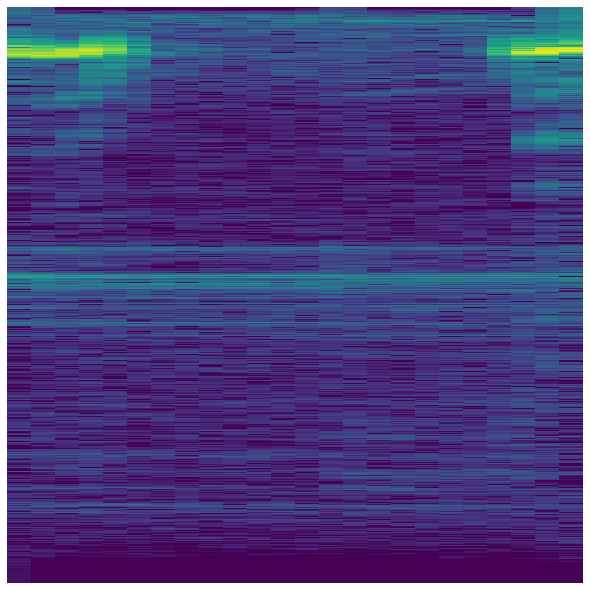

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

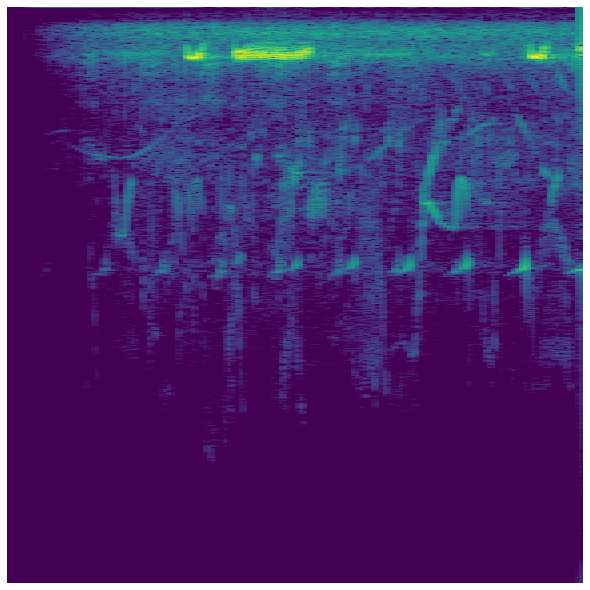

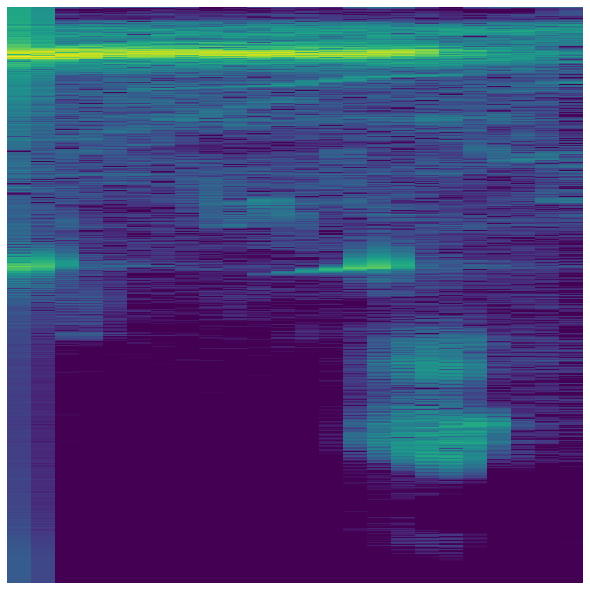

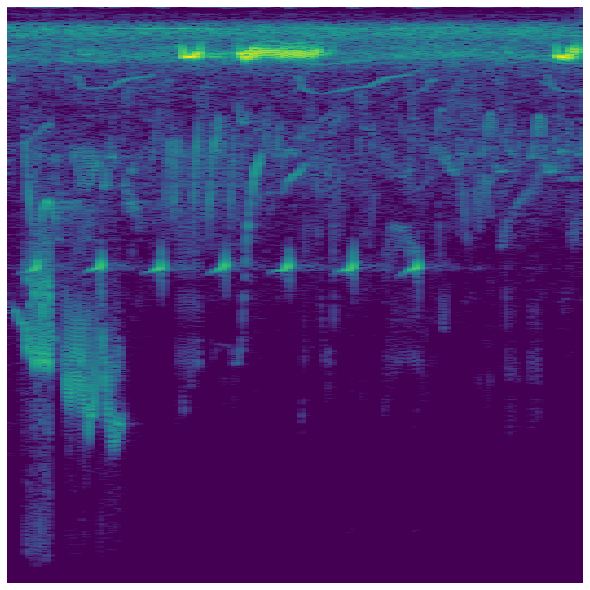

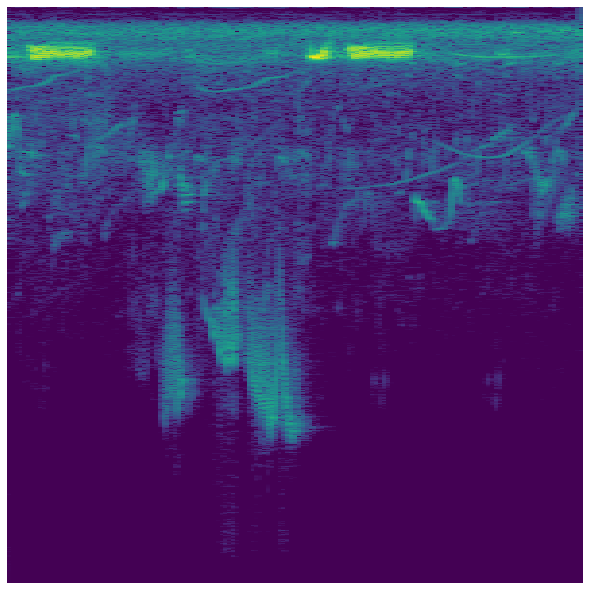

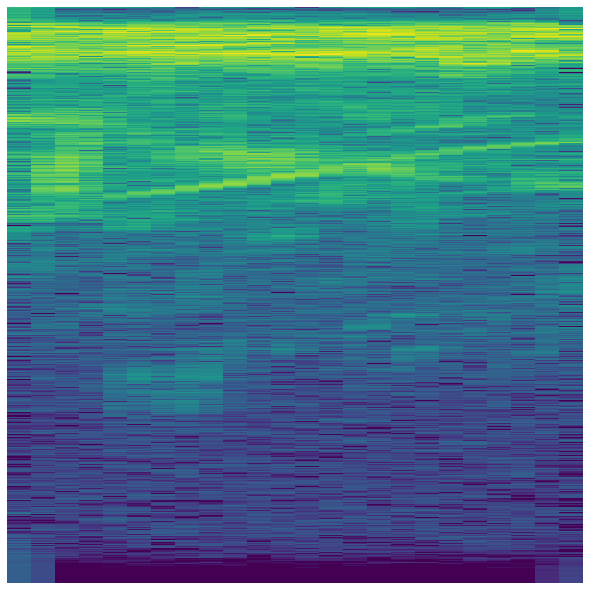

<Figure size 576x576 with 0 Axes>

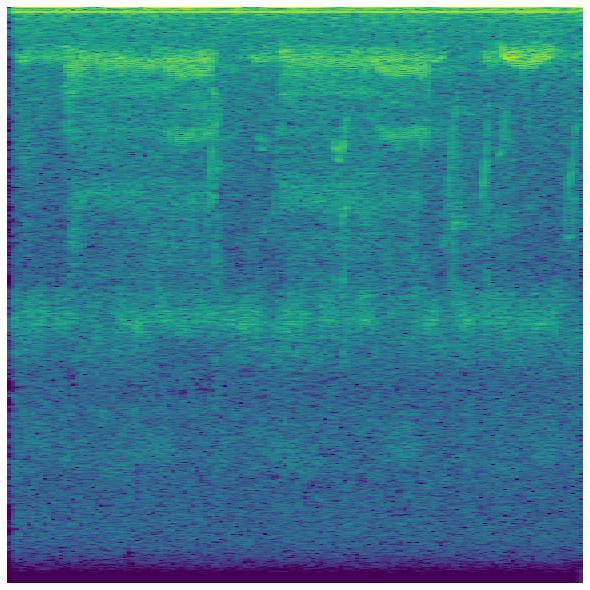

<Figure size 576x576 with 0 Axes>

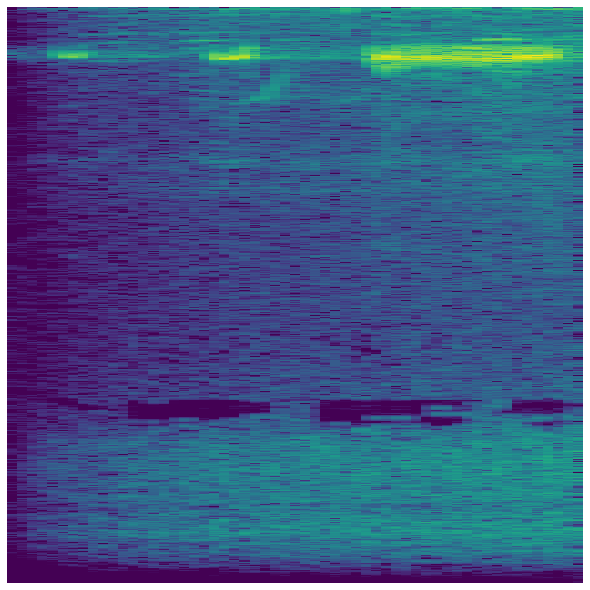

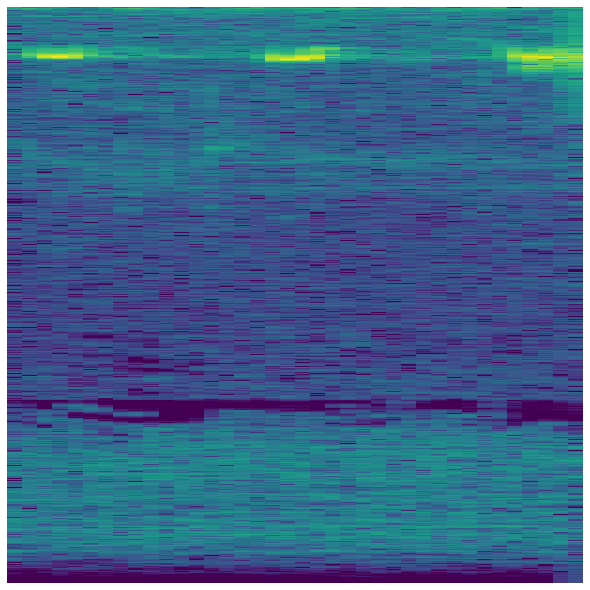

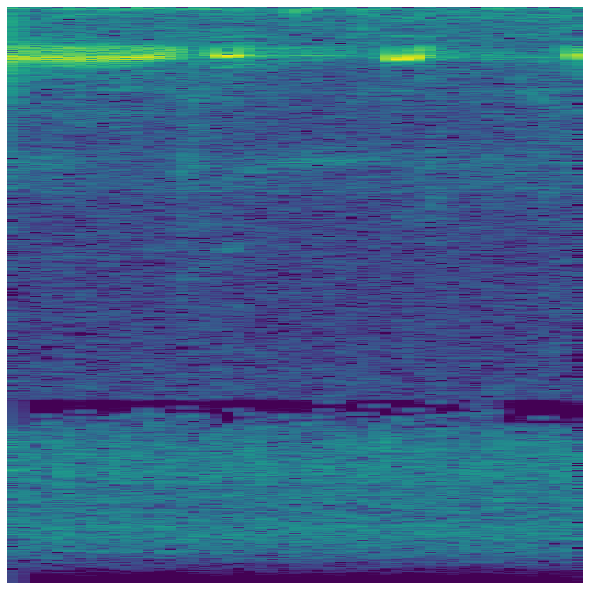

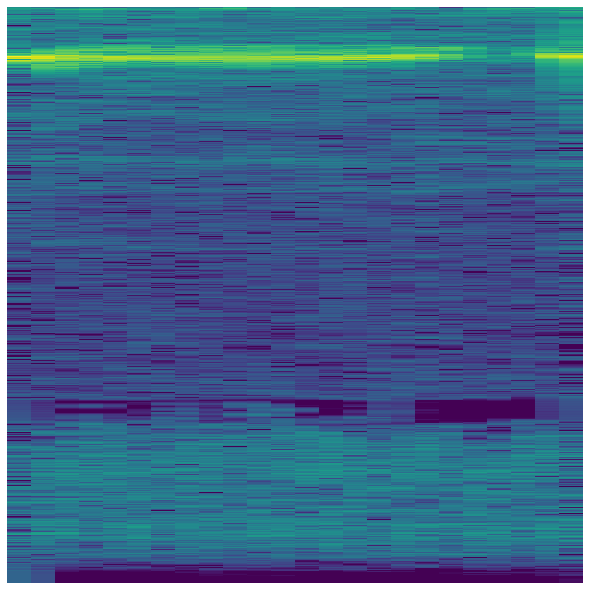

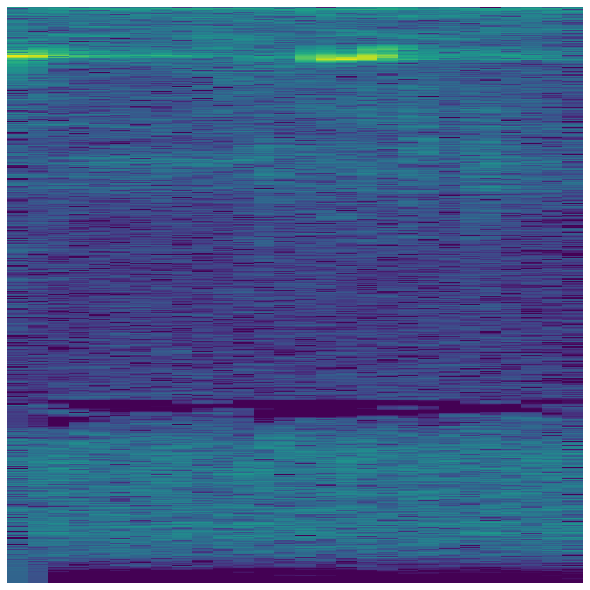

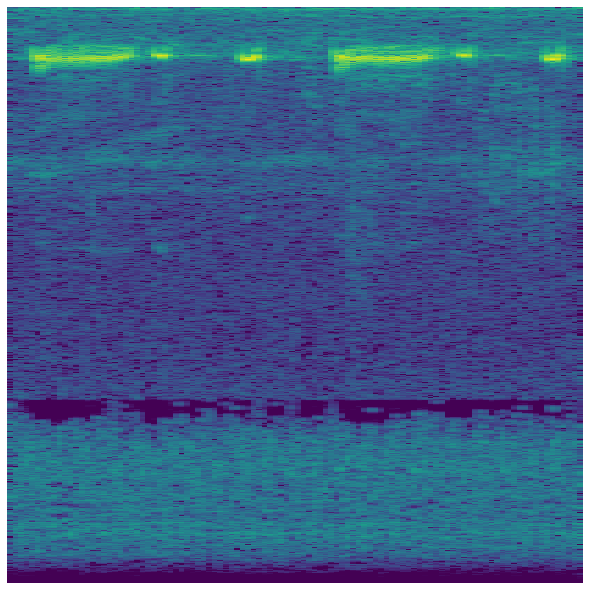

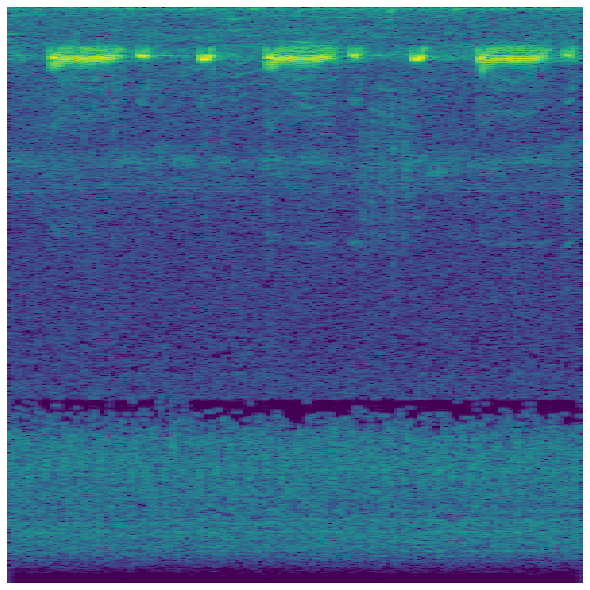

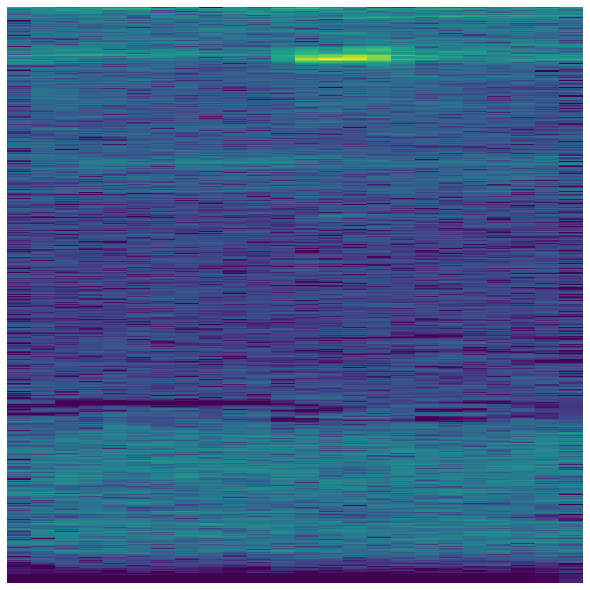

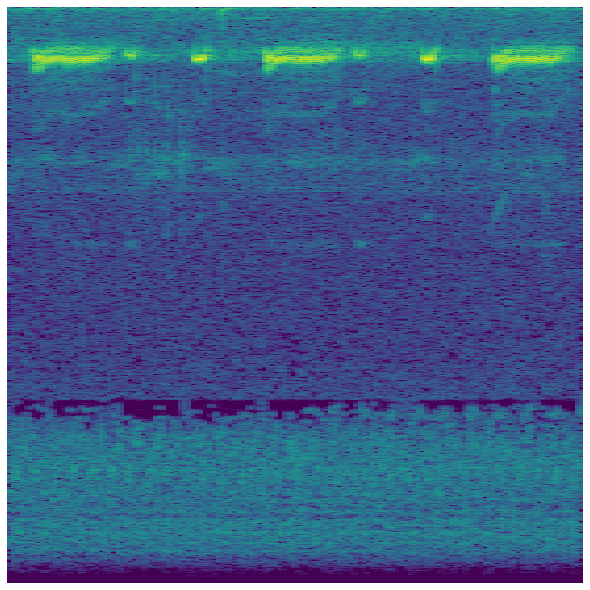

<Figure size 576x576 with 0 Axes>

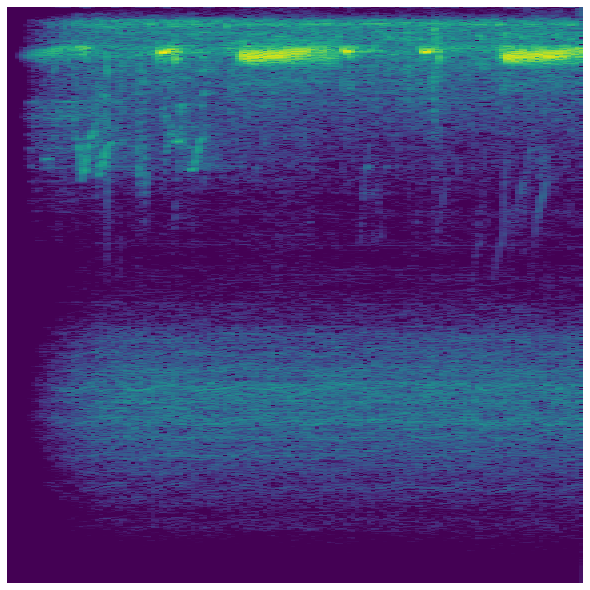

<Figure size 576x576 with 0 Axes>

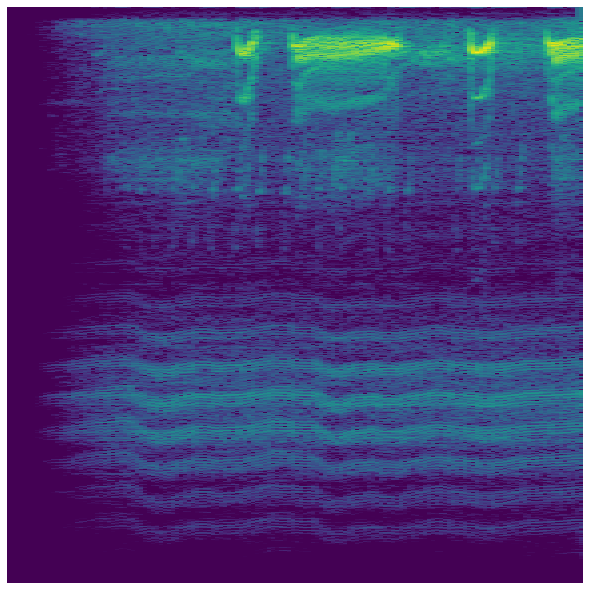

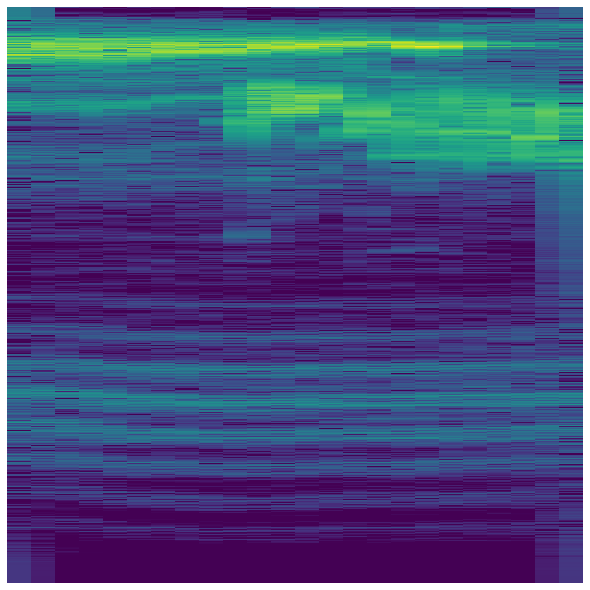

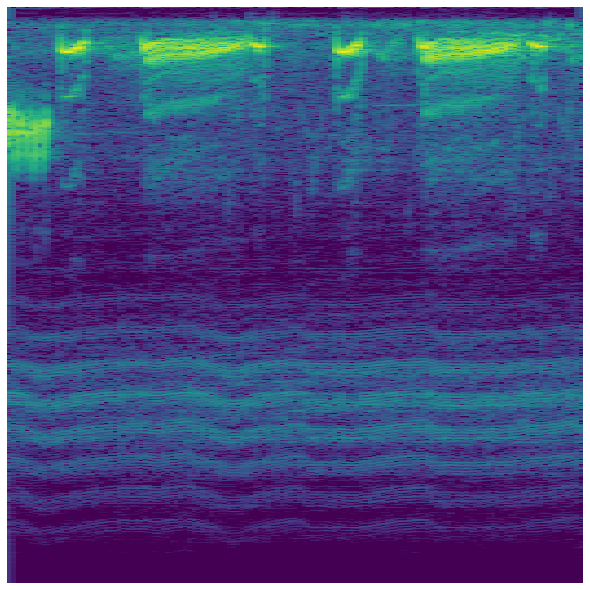

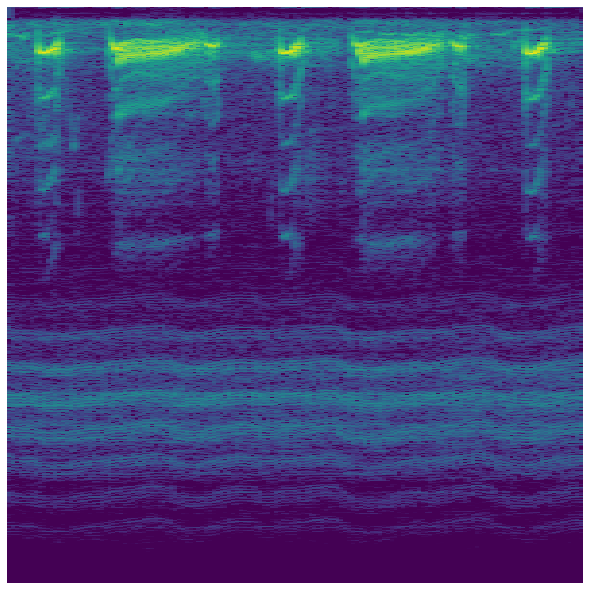

<Figure size 576x576 with 0 Axes>

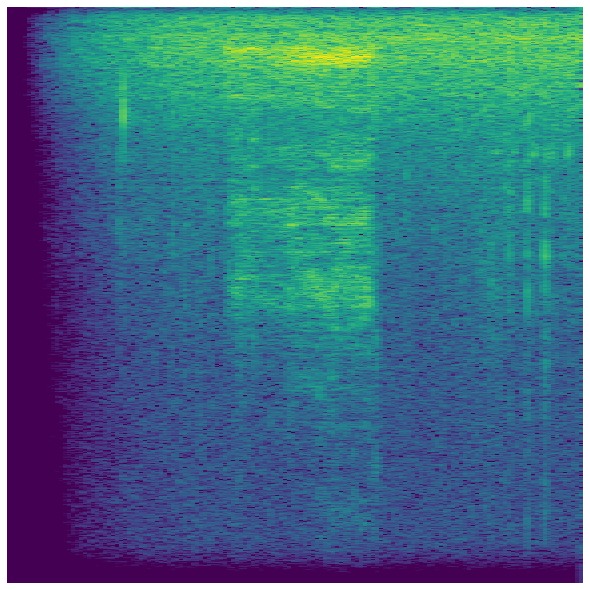

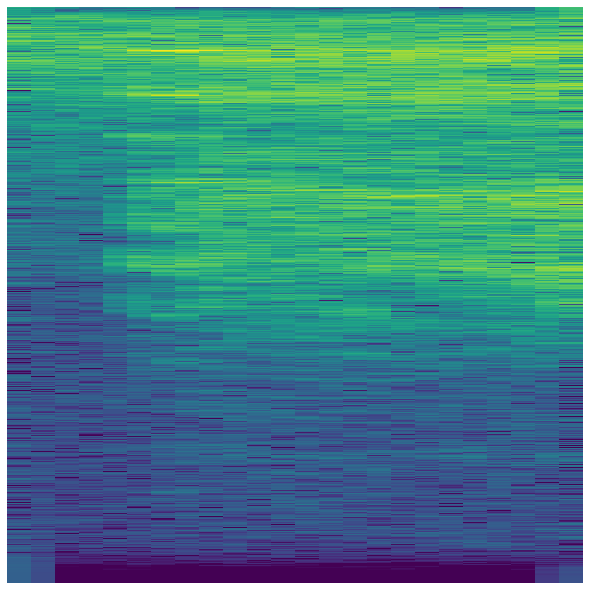

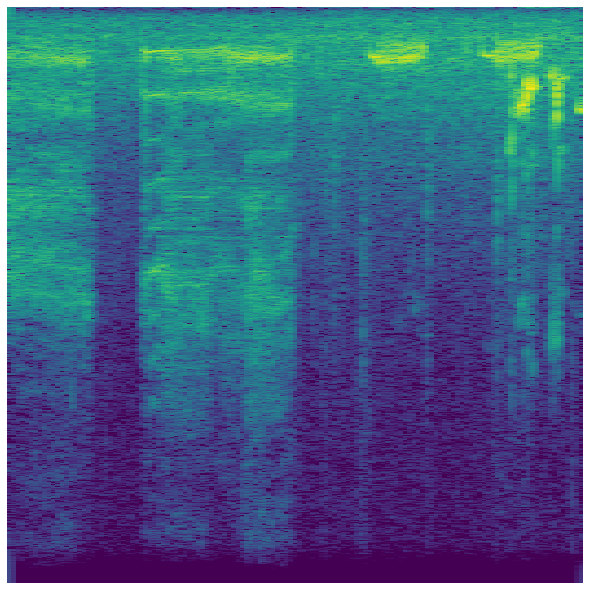

<Figure size 576x576 with 0 Axes>

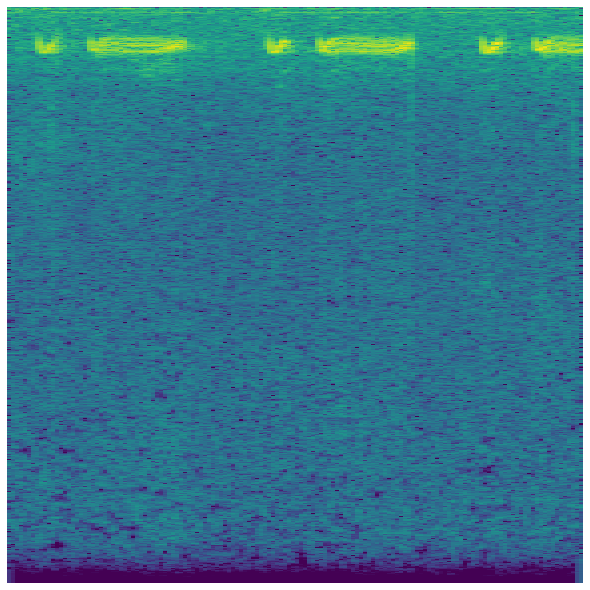

<Figure size 576x576 with 0 Axes>

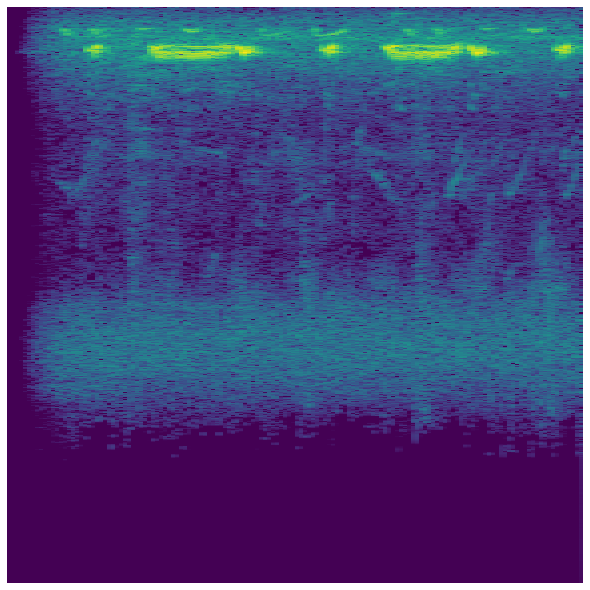

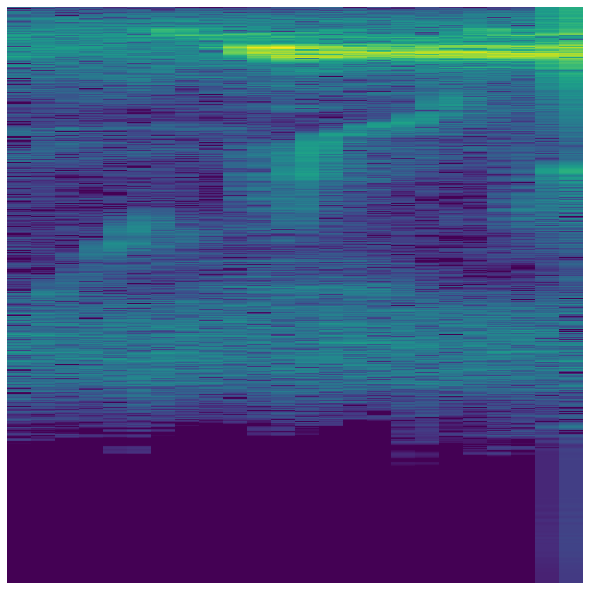

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

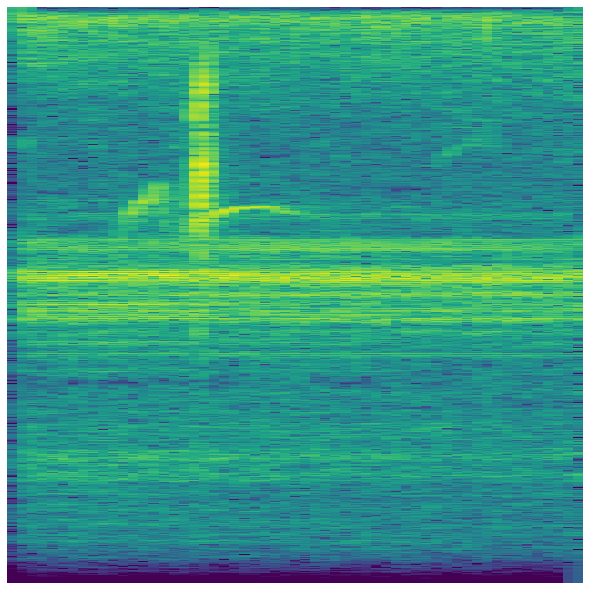

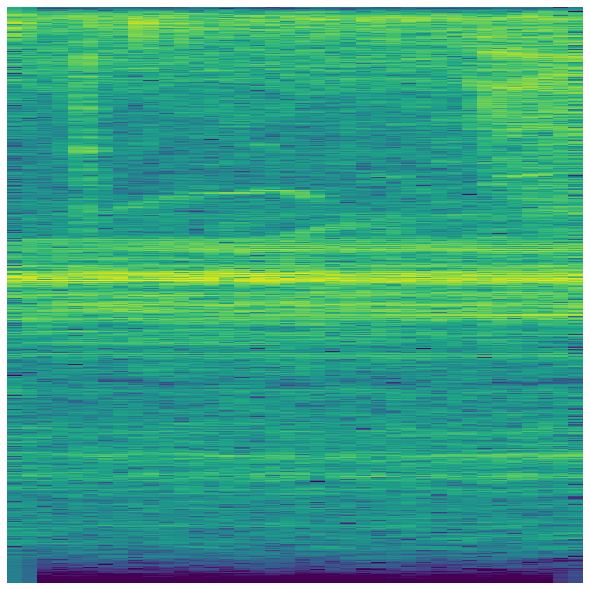

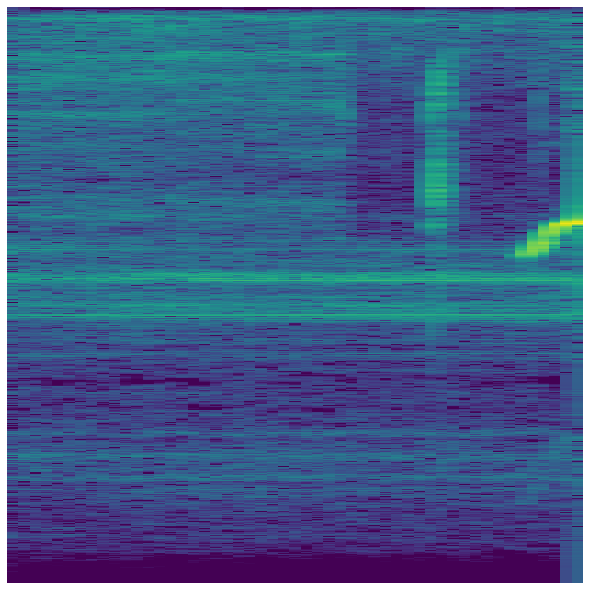

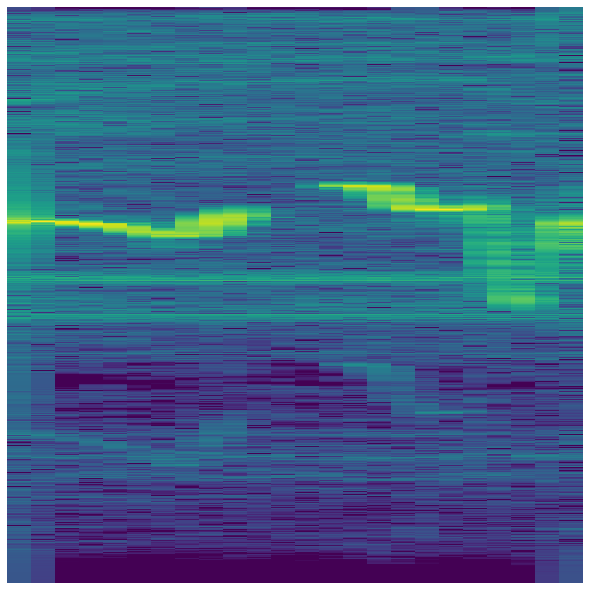

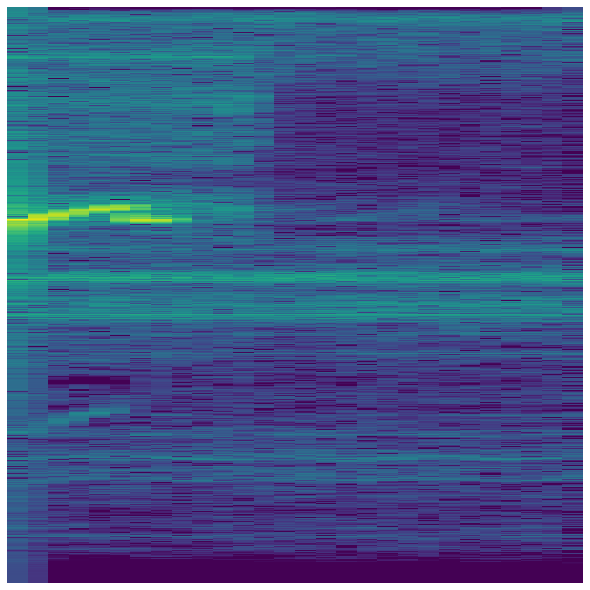

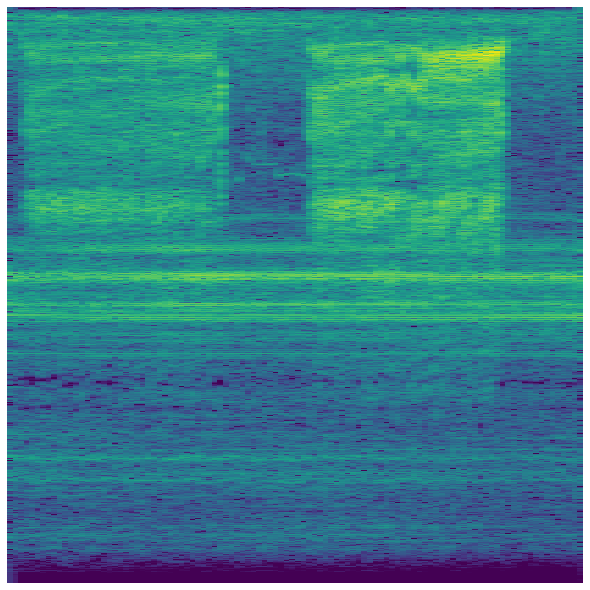

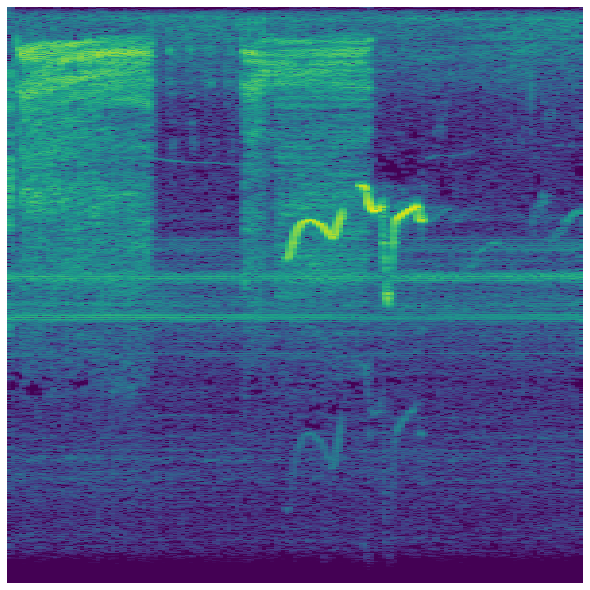

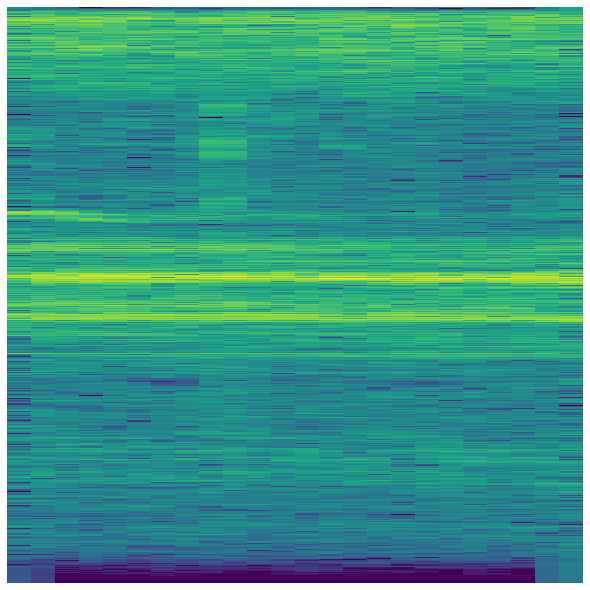

<Figure size 576x576 with 0 Axes>

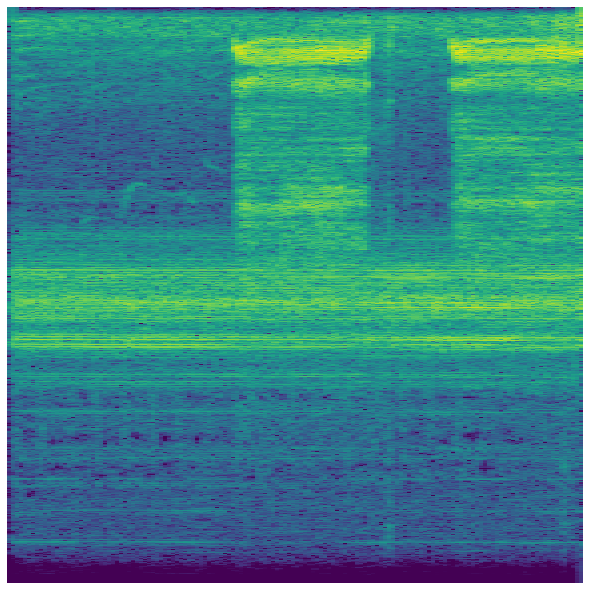

<Figure size 576x576 with 0 Axes>

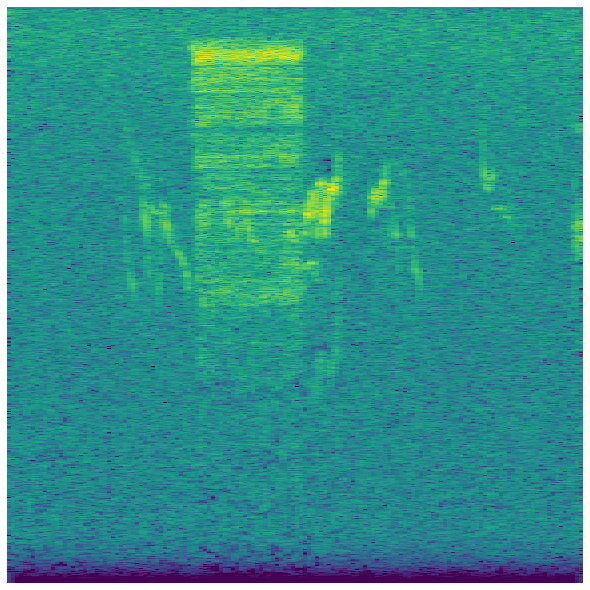

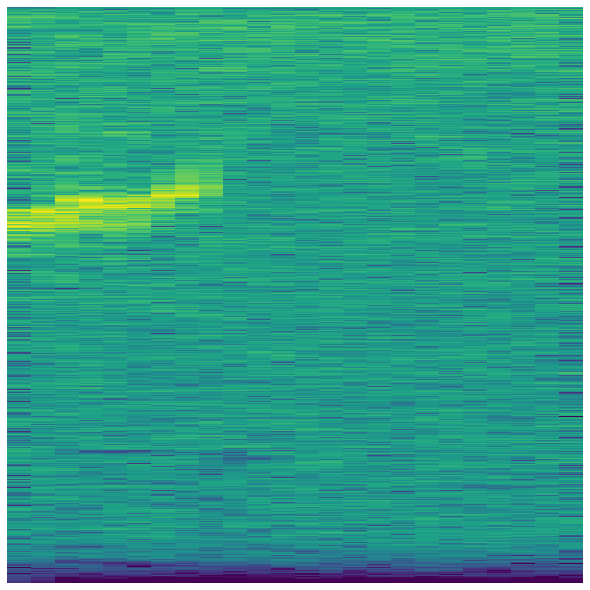

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

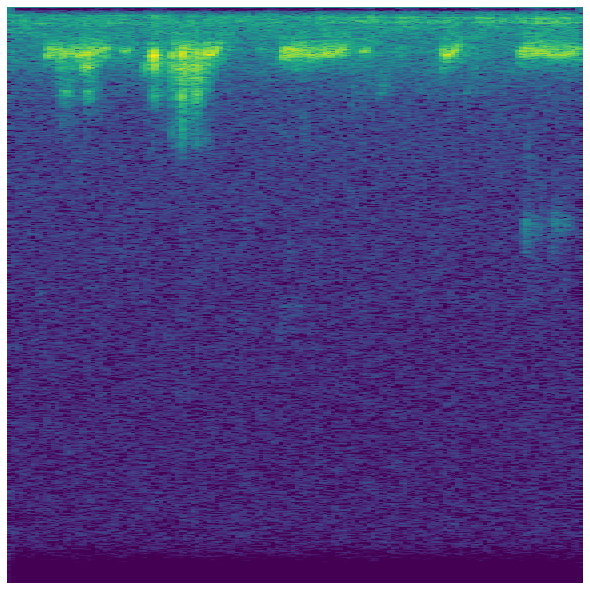

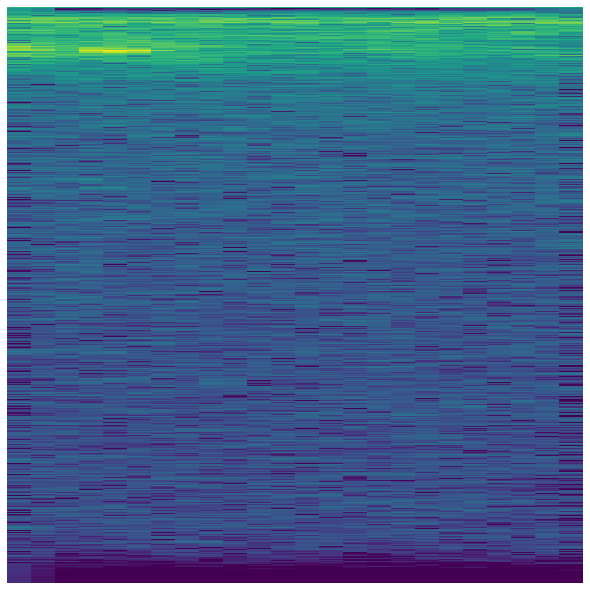

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

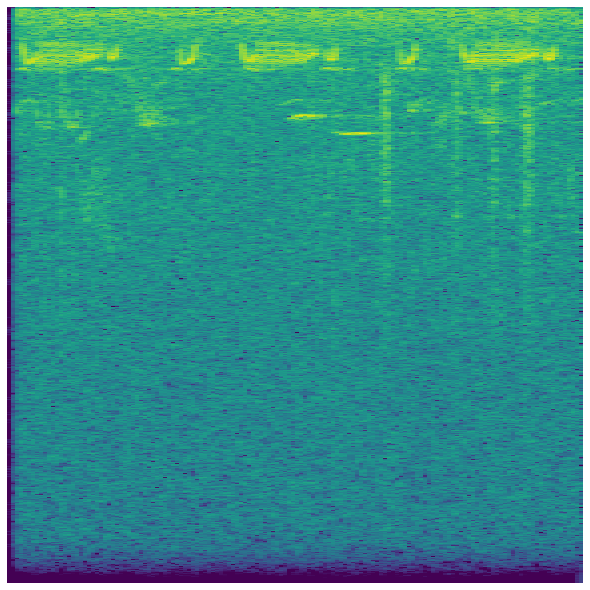

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

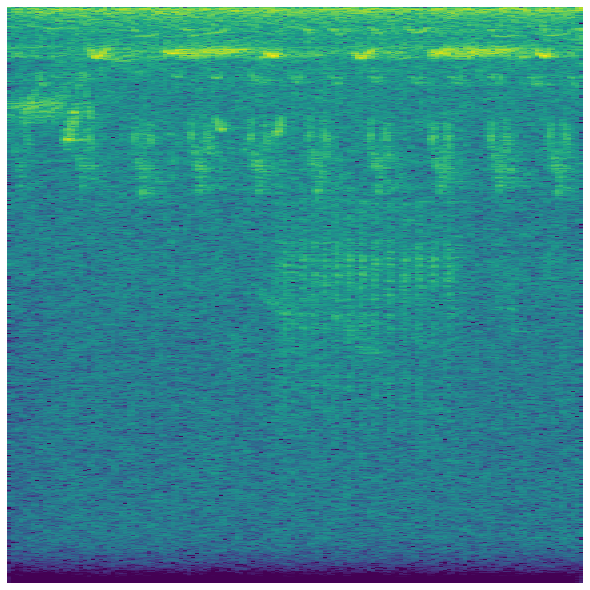

<Figure size 576x576 with 0 Axes>

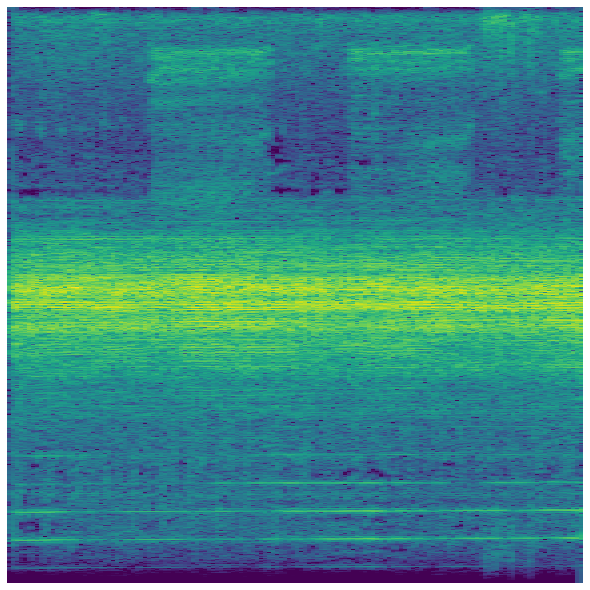

In [95]:
# ONE TIME USE!
skip = True
import numpy as np
import os
for i, pth in enumerate(np.concatenate([train['file_name'].values, sub['file_name'].values])):
  print(i*100//(len(sub)+len(train)), '% done')
  # Check if we've already generated a spectrogram, and if not, make one
  #if not os.path.isfile(pth[:-4]+'.png'):
  plt.clf()
  if skip = False:
    gen_spectrogram(pth)
    #gen_spectrogram_cuts(pth)  ## cuts were not good enough, but the same loop created them
    ipd.clear_output(wait=True)
    plt.close()

In [12]:
# Checking that the spectrograms were generated successfully:
import glob
ims = glob.glob('Train/*.png')
train['img_path'] = train['file_name'].str[:-4]+'.png'
print(len(ims), len(train))

1857 1857


In [13]:
# Similarly, test now has rows for files that have had spectrograms created.
sub['img_path'] = sub['file_name'].str[:-4]+'.png'
ims = glob.glob('Test/*.png')
test = sub.loc[sub.img_path.isin(ims)]
print(len(sub), len(test))

911 911


In [49]:
# From here, begin modeling.